# Atividade 5 — Análise Global, Local e de Textura em Mini Dataset Próprio

Nesta atividade eu reutilizo o meu mini dataset com duas classes: `classe_A`, formada por imagens da placa STM32N6-DK, e `classe_B`, formada por imagens de um multímetro analógico clássico.

O objetivo é comparar diferentes formas de representar as imagens: descritores globais, descritores locais e descritores de textura. Ao longo do notebook eu procuro responder à pergunta central do enunciado: o que cada descritor preserva e o que ele perde?


In [1]:
from pathlib import Path
import random
import math

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, ImageFilter, ImageEnhance
from scipy import ndimage
from scipy.stats import entropy

try:
    import cv2
    CV2_DISPONIVEL = True
except ModuleNotFoundError:
    CV2_DISPONIVEL = False

plt.rcParams['figure.figsize'] = (10, 6)

RANDOM_SEED = None  # use um número inteiro se quiser repetir a mesma seleção
LARGURA_PADRAO = 800
IMAGENS_POR_CLASSE = 5

if RANDOM_SEED is not None:
    random.seed(RANDOM_SEED)
    np.random.seed(RANDOM_SEED)


# Parte 1 — Preparação do Dataset e Hipótese Inicial

O PDF pede que eu reapresente as duas classes do mini dataset, mostre a estrutura de pastas e exiba pelo menos duas imagens de cada classe. Para evitar uma seleção fixa, eu escolho aleatoriamente imagens das pastas `classe_A` e `classe_B` a cada execução.

Como o enunciado pede estatísticas para 10 imagens originais, eu seleciono até 5 imagens de cada classe e uso esse subconjunto como base da análise global. A imagem representante de cada classe também é escolhida aleatoriamente a partir desse conjunto.


In [2]:
def localizar_dataset():
    candidatos = [Path.cwd() / 'dataset', Path.cwd().parent / 'dataset']
    for candidato in candidatos:
        if (candidato / 'classe_A').exists() and (candidato / 'classe_B').exists():
            return candidato
    raise FileNotFoundError('Não encontrei dataset/classe_A e dataset/classe_B.')


def listar_imagens(pasta):
    extensoes = {'.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff'}
    imagens = sorted([p for p in pasta.iterdir() if p.suffix.lower() in extensoes])
    if not imagens:
        raise FileNotFoundError(f'Nenhuma imagem encontrada em {pasta}')
    return imagens


def carregar_imagem(caminho, largura=LARGURA_PADRAO):
    with Image.open(caminho) as img:
        formato = img.format or caminho.suffix.lower().replace('.', '').upper()
        img = img.convert('RGB')
        largura_original, altura_original = img.size
        escala = largura / largura_original
        nova_altura = int(round(altura_original * escala))
        img = img.resize((largura, nova_altura), Image.Resampling.LANCZOS)
        rgb = np.array(img)
        gray = np.array(img.convert('L'))

    return {
        'caminho': caminho,
        'arquivo': caminho.name,
        'classe': caminho.parent.name,
        'formato': formato,
        'resolucao_original': f'{largura_original} x {altura_original}',
        'resolucao_usada': f'{largura} x {nova_altura}',
        'rgb': rgb,
        'gray': gray,
    }


dataset_dir = localizar_dataset()
classe_a_paths = listar_imagens(dataset_dir / 'classe_A')
classe_b_paths = listar_imagens(dataset_dir / 'classe_B')

selecionadas_a = random.sample(classe_a_paths, min(IMAGENS_POR_CLASSE, len(classe_a_paths)))
selecionadas_b = random.sample(classe_b_paths, min(IMAGENS_POR_CLASSE, len(classe_b_paths)))

imagens_a = [carregar_imagem(p) for p in selecionadas_a]
imagens_b = [carregar_imagem(p) for p in selecionadas_b]
imagens_dataset = imagens_a + imagens_b

representante_a = random.choice(imagens_a)
representante_b = random.choice(imagens_b)

print('Estrutura de pastas utilizada:')
print(dataset_dir)
print('├── classe_A')
for p in classe_a_paths:
    print('│   ├──', p.name)
print('└── classe_B')
for p in classe_b_paths:
    print('    ├──', p.name)

print('\nImagens selecionadas para a análise:')
for item in imagens_dataset:
    print(f"{item['classe']} | {item['arquivo']} | {item['resolucao_usada']} px | {item['formato']}")

Estrutura de pastas utilizada:
/home/carlosdelfino/Documentos/Faculdade, Cursos e Estudos/Capacitações/Visão Computacional/Atividades/dataset
├── classe_A
│   ├── STM32N6-DK-frontal.jpeg
│   ├── STM32N6-DK-frontal_direito.jpeg
│   ├── STM32N6-DK-frontal_esquerdo.jpeg
│   ├── STM32N6-DK-frontal_esquerdo_luz_natural.jpeg
│   ├── STM32N6-DK-frontal_luz_natural.jpeg
│   ├── STM32N6-DK-traseira.jpeg
└── classe_B
    ├── Multimetro-Analógico-Classico-frontal.jpeg
    ├── Multimetro-Analógico-Classico-frontal_direita_luz_natural.jpeg.jpeg
    ├── Multimetro-Analógico-Classico-frontal_direito.jpeg
    ├── Multimetro-Analógico-Classico-frontal_esquerdo.jpeg
    ├── Multimetro-Analógico-Classico-frontal_esquerdo_luz_natural.jpeg.jpeg
    ├── Multimetro-Analógico-Classico-frontal_luz_natural.jpeg

Imagens selecionadas para a análise:
classe_A | STM32N6-DK-frontal_luz_natural.jpeg | 800 x 1422 px | JPEG
classe_A | STM32N6-DK-frontal_esquerdo.jpeg | 800 x 450 px | JPEG
classe_A | STM32N6-DK-frontal

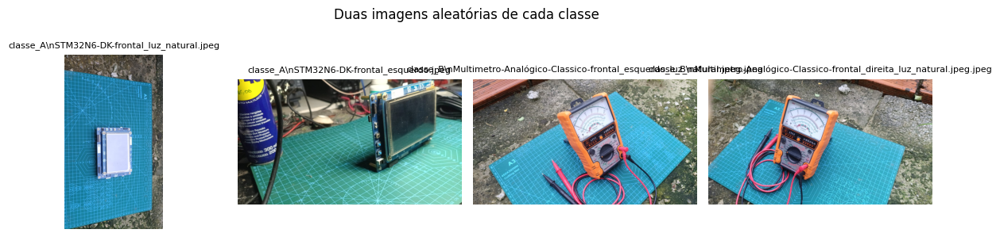

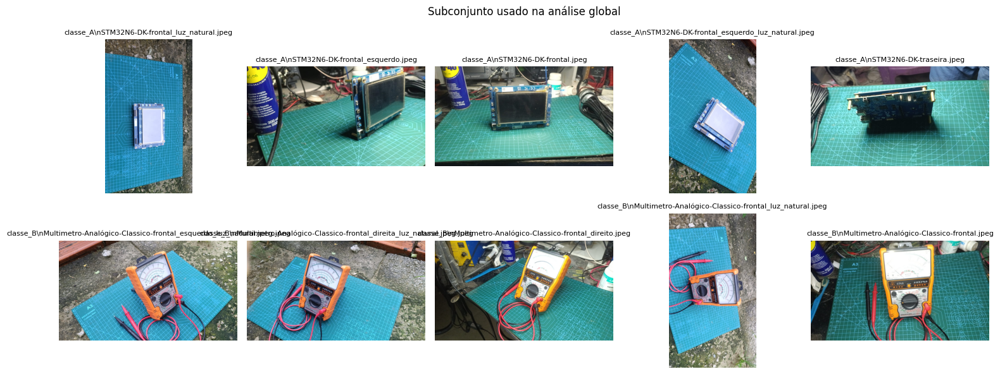

In [3]:
def mostrar_grade(imagens, titulo, colunas=5):
    linhas = math.ceil(len(imagens) / colunas)
    fig, axes = plt.subplots(linhas, colunas, figsize=(3 * colunas, 3 * linhas))
    axes = np.atleast_1d(axes).ravel()

    for ax, item in zip(axes, imagens):
        ax.imshow(item['rgb'])
        ax.set_title(f"{item['classe']}\\n{item['arquivo']}", fontsize=8)
        ax.axis('off')

    for ax in axes[len(imagens):]:
        ax.axis('off')

    fig.suptitle(titulo)
    plt.tight_layout()
    plt.show()

mostrar_grade(imagens_a[:2] + imagens_b[:2], 'Duas imagens aleatórias de cada classe', colunas=4)
mostrar_grade(imagens_dataset, 'Subconjunto usado na análise global', colunas=5)

## Hipótese Inicial

Eu espero que a `classe_A` e a `classe_B` sejam mais distinguíveis por forma, estrutura e distribuição espacial dos detalhes do que apenas por textura. A placa STM32N6-DK tem muitos componentes pequenos, conectores e regiões com alta variação local. O multímetro possui uma estrutura maior, com mostrador, escala e carcaça mais contínua.

Antes do experimento, minha hipótese é que os descritores locais serão os mais úteis, porque preservam cantos, bordas e pontos característicos. Histogramas e estatísticas globais devem ajudar a perceber iluminação e cor predominante, mas perdem a organização espacial. Já GLCM e LBP podem contribuir, mas talvez não sejam os descritores mais discriminativos porque o dataset é mais estrutural do que textural.

Os fatores de aquisição que mais podem influenciar a análise são iluminação, ângulo de captura, distância da câmera, resolução, compressão JPEG, sombras, reflexos e mudanças na cor predominante do fundo ou do objeto.


# Parte 2 — Análise Global: Histogramas e Estatísticas

Nesta etapa eu calculo média, variância, desvio padrão e entropia para as imagens selecionadas. Essas métricas resumem a imagem inteira, então preservam características globais de brilho, contraste e diversidade de intensidades, mas perdem a posição dos objetos e a forma das estruturas.


In [4]:
def calcular_estatisticas(item):
    gray = item['gray']
    hist, _ = np.histogram(gray.ravel(), bins=256, range=(0, 256), density=True)
    return {
        'Classe': item['classe'],
        'Imagem': item['arquivo'],
        'Média': round(float(np.mean(gray)), 2),
        'Variância': round(float(np.var(gray)), 2),
        'Desvio padrão': round(float(np.std(gray)), 2),
        'Entropia': round(float(entropy(hist + 1e-12, base=2)), 4),
    }

estatisticas = pd.DataFrame([calcular_estatisticas(item) for item in imagens_dataset])
estatisticas


,Classe,Imagem,Média,Variância,Desvio padrão,Entropia
0,classe_A,STM32N6-DK-frontal_luz_natural.jpeg,110.95,1602.27,40.03,6.9281
1,classe_A,STM32N6-DK-frontal_esquerdo.jpeg,112.00,3645.57,60.38,7.7203
2,classe_A,STM32N6-DK-frontal.jpeg,112.74,3363.28,57.99,7.6697
3,classe_A,STM32N6-DK-frontal_esquerdo_luz_natural.jpeg,120.24,1988.86,44.60,7.2494
4,classe_A,STM32N6-DK-traseira.jpeg,117.62,3341.80,57.81,7.6031
5,classe_B,Multimetro-Analógico-Classico-frontal_esquerdo...,128.74,1867.77,43.22,7.4075
6,classe_B,Multimetro-Analógico-Classico-frontal_direita_...,128.67,1729.71,41.59,7.3504
7,classe_B,Multimetro-Analógico-Classico-frontal_direito....,107.59,3486.91,59.05,7.5726
8,classe_B,Multimetro-Analógico-Classico-frontal_luz_natu...,136.23,1609.69,40.12,7.3139
9,classe_B,Multimetro-Analógico-Classico-frontal.jpeg,104.87,3636.97,60.31,7.3093


## Histogramas de Intensidade e Cor

Agora eu comparo histogramas de intensidade e histogramas RGB em pelo menos duas imagens de cada classe. O histograma mostra onde os pixels se concentram, se a imagem é mais escura, média ou clara, e se existe algum canal de cor predominante.


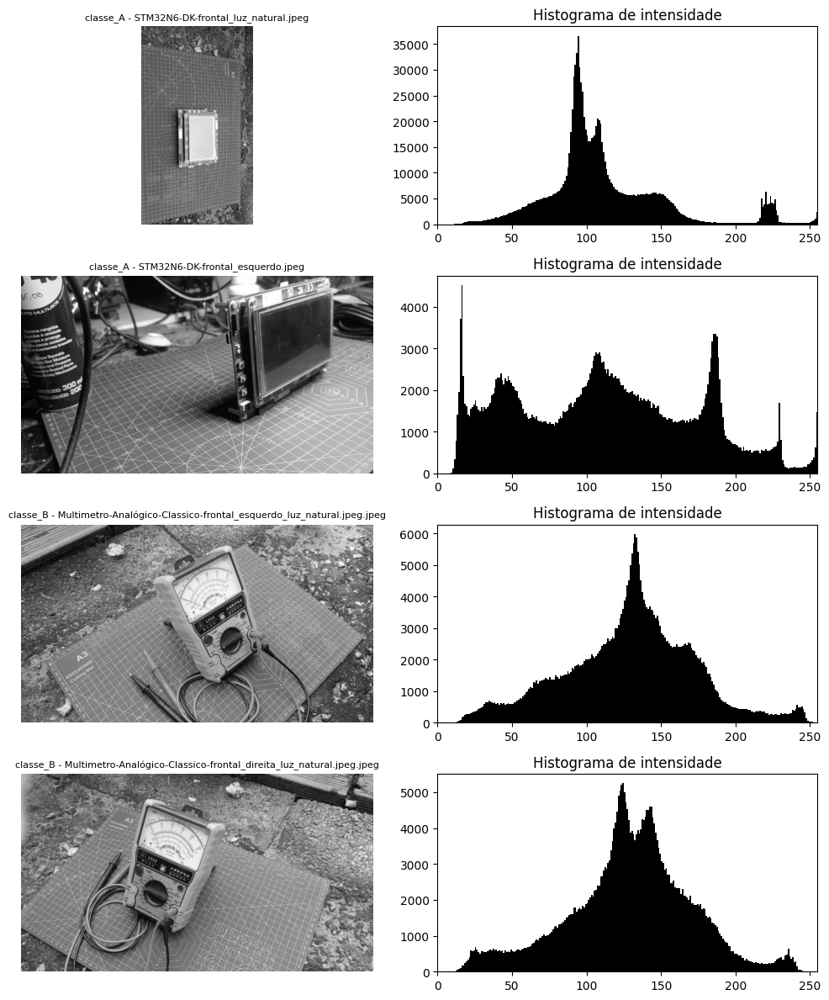

In [5]:
def plotar_histogramas_intensidade(imagens):
    fig, axes = plt.subplots(len(imagens), 2, figsize=(10, 3 * len(imagens)))
    axes = np.atleast_2d(axes)

    for linha, item in enumerate(imagens):
        axes[linha, 0].imshow(item['gray'], cmap='gray')
        axes[linha, 0].set_title(f"{item['classe']} - {item['arquivo']}", fontsize=8)
        axes[linha, 0].axis('off')

        axes[linha, 1].hist(item['gray'].ravel(), bins=256, range=(0, 256), color='black')
        axes[linha, 1].set_title('Histograma de intensidade')
        axes[linha, 1].set_xlim(0, 255)

    plt.tight_layout()
    plt.show()

amostra_hist = imagens_a[:2] + imagens_b[:2]
plotar_histogramas_intensidade(amostra_hist)


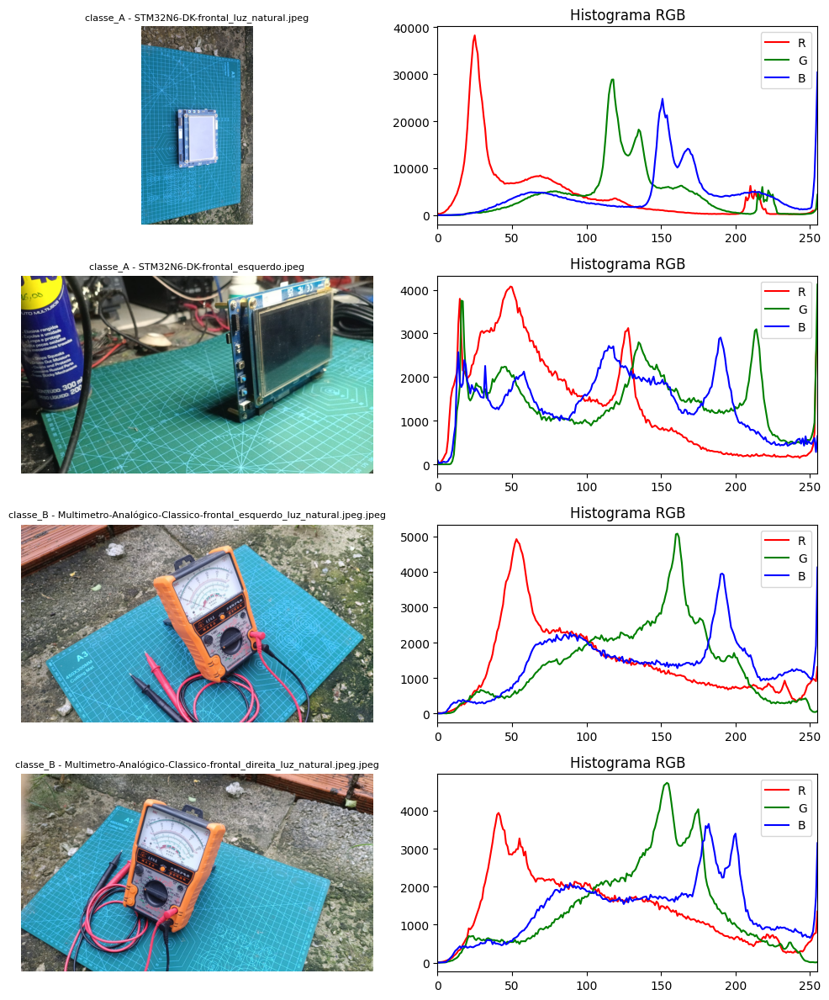

In [6]:
def plotar_histogramas_rgb(imagens):
    fig, axes = plt.subplots(len(imagens), 2, figsize=(10, 3 * len(imagens)))
    axes = np.atleast_2d(axes)

    for linha, item in enumerate(imagens):
        axes[linha, 0].imshow(item['rgb'])
        axes[linha, 0].set_title(f"{item['classe']} - {item['arquivo']}", fontsize=8)
        axes[linha, 0].axis('off')

        for canal, cor, nome in [(0, 'red', 'R'), (1, 'green', 'G'), (2, 'blue', 'B')]:
            hist, _ = np.histogram(item['rgb'][:, :, canal].ravel(), bins=256, range=(0, 256))
            axes[linha, 1].plot(hist, color=cor, label=nome)
        axes[linha, 1].set_title('Histograma RGB')
        axes[linha, 1].set_xlim(0, 255)
        axes[linha, 1].legend()

    plt.tight_layout()
    plt.show()

plotar_histogramas_rgb(amostra_hist)


## Interpretação dos Histogramas

Ao observar os histogramas, eu verifico se os pixels se concentram mais em tons escuros, médios ou claros. Nas imagens da placa e do multímetro, essa concentração depende bastante da iluminação e do fundo usado na captura. Por isso, imagens da mesma classe podem ter comportamento parecido quando foram capturadas em condições próximas, mas podem mudar quando há luz natural, sombra ou ângulo diferente.

Os canais RGB ajudam a perceber cor predominante, mas eu não espero que cor sozinha separe perfeitamente as classes. O histograma preserva distribuição global de cor e intensidade, porém perde a forma da placa, o formato do multímetro, a posição dos conectores, o mostrador e outras estruturas espaciais importantes.

Assim, eu considero que os histogramas ajudam parcialmente, principalmente para analisar iluminação e cor predominante, mas não são suficientes para separar as classes com segurança.


## Relação com a Tarefa Anterior

O enunciado pede comparar uma imagem original de cada classe com uma versão derivada. Aqui eu gero no próprio notebook uma versão derivada por redução de resolução e compressão visual simulada: diminuo a imagem e depois aumento novamente. Isso reduz detalhes finos e permite observar mudança no histograma e na entropia.


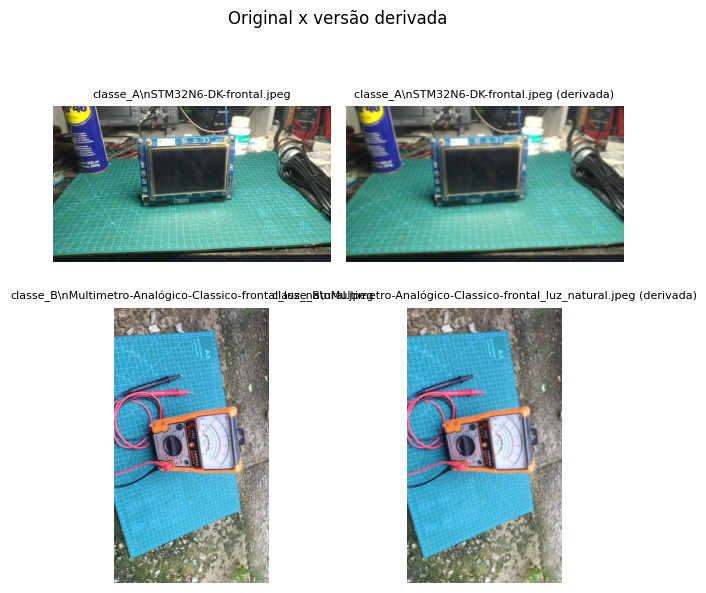

,Classe,Imagem,Média,Variância,Desvio padrão,Entropia
0,classe_A,STM32N6-DK-frontal.jpeg,112.74,3363.28,57.99,7.6697
1,classe_A,STM32N6-DK-frontal.jpeg (derivada),112.75,2976.98,54.56,7.5828
2,classe_B,Multimetro-Analógico-Classico-frontal_luz_natu...,136.23,1609.69,40.12,7.3139
3,classe_B,Multimetro-Analógico-Classico-frontal_luz_natu...,136.24,1355.45,36.82,7.1669


In [7]:
def gerar_versao_derivada(item, fator=0.35):
    img = Image.fromarray(item['rgb'])
    largura, altura = img.size
    reduzida = img.resize((max(1, int(largura * fator)), max(1, int(altura * fator))), Image.Resampling.BILINEAR)
    reconstruida = reduzida.resize((largura, altura), Image.Resampling.BILINEAR)
    rgb = np.array(reconstruida)
    gray = np.array(reconstruida.convert('L'))
    return {
        **item,
        'arquivo': item['arquivo'] + ' (derivada)',
        'rgb': rgb,
        'gray': gray,
    }


derivada_a = gerar_versao_derivada(representante_a)
derivada_b = gerar_versao_derivada(representante_b)
comparacao_derivadas = [representante_a, derivada_a, representante_b, derivada_b]

mostrar_grade(comparacao_derivadas, 'Original x versão derivada', colunas=2)

pd.DataFrame([calcular_estatisticas(item) for item in comparacao_derivadas])


Na comparação com as versões derivadas, eu espero uma pequena perda de entropia ou uma mudança no espalhamento das intensidades, porque detalhes finos são suavizados pela redução e reamostragem. A perda perceptível de informação aparece principalmente em bordas, textos pequenos, conectores e marcações. O histograma pode não mudar de forma extrema, porque ele não preserva a localização dos detalhes, mas a aparência visual perde nitidez.


# Parte 3 — Análise Local: Pontos de Interesse, Descritores e Matching

Nesta parte eu analiso pontos locais. Diferente dos histogramas, os descritores locais preservam regiões estruturais como cantos, bordas e pequenos padrões. Eles perdem a visão global completa da imagem, mas são importantes para comparar formas e partes correspondentes entre capturas.

Quando OpenCV está disponível, o notebook usa ORB e BFMatcher com distância de Hamming, conforme pedido no PDF. Se OpenCV não estiver disponível no ambiente, eu uso um descritor local simples por patches apenas para manter o notebook executável, mas a interpretação continua destacando que a entrega principal no Colab deve ser ORB.


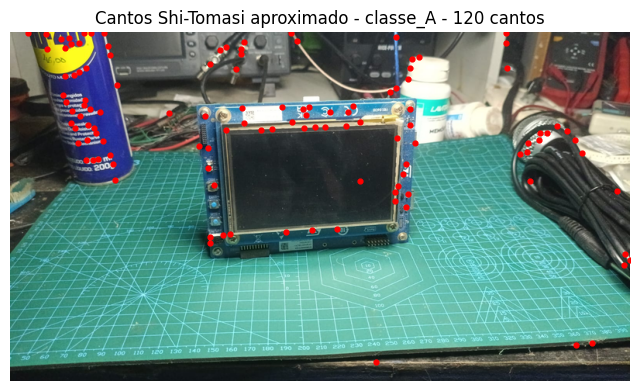

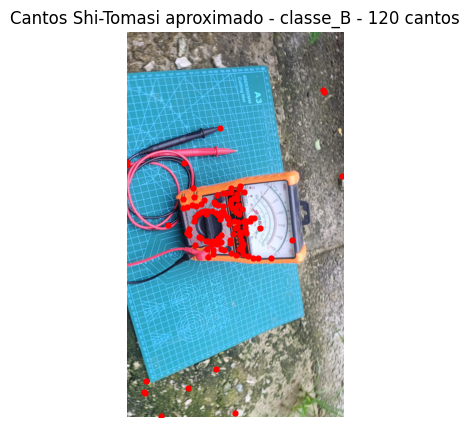

In [8]:
def detectar_cantos_shi_tomasi_aproximado(gray, max_cantos=120, distancia_minima=12):
    img = gray.astype(np.float32) / 255.0
    ix = ndimage.sobel(img, axis=1)
    iy = ndimage.sobel(img, axis=0)
    ixx = ndimage.gaussian_filter(ix * ix, sigma=1)
    iyy = ndimage.gaussian_filter(iy * iy, sigma=1)
    ixy = ndimage.gaussian_filter(ix * iy, sigma=1)

    traco = ixx + iyy
    determinante = ixx * iyy - ixy ** 2
    resposta = traco / 2 - np.sqrt(np.maximum((traco / 2) ** 2 - determinante, 0))
    resposta = ndimage.maximum_filter(resposta, size=distancia_minima) == resposta
    valores = np.where(resposta, traco / 2, 0)

    ys, xs = np.where(valores > np.percentile(valores[valores > 0], 85) if np.any(valores > 0) else valores > 0)
    pontos = sorted(zip(xs, ys), key=lambda p: valores[p[1], p[0]], reverse=True)[:max_cantos]
    return pontos


def mostrar_cantos(item, titulo):
    pontos = detectar_cantos_shi_tomasi_aproximado(item['gray'])
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.imshow(item['rgb'])
    if pontos:
        xs, ys = zip(*pontos)
        ax.scatter(xs, ys, s=12, c='red')
    ax.set_title(f'{titulo} - {len(pontos)} cantos')
    ax.axis('off')
    plt.show()
    return pontos

cantos_a = mostrar_cantos(representante_a, 'Cantos Shi-Tomasi aproximado - classe_A')
cantos_b = mostrar_cantos(representante_b, 'Cantos Shi-Tomasi aproximado - classe_B')


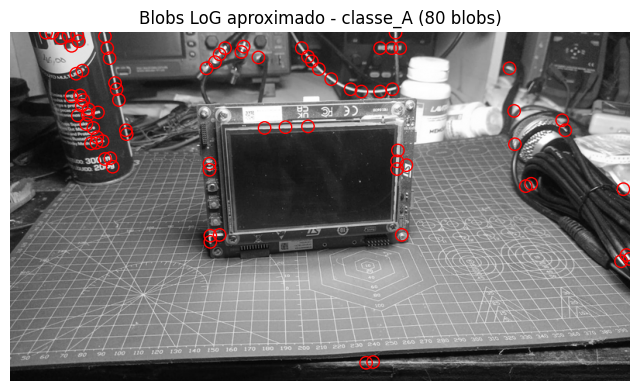

In [9]:
def detectar_blobs_log(gray, sigma=2.0, threshold_percentil=99.2, max_blobs=80):
    img = gray.astype(np.float32) / 255.0
    log = -ndimage.gaussian_laplace(img, sigma=sigma) * sigma ** 2
    maximos = ndimage.maximum_filter(log, size=9) == log
    limite = np.percentile(log, threshold_percentil)
    ys, xs = np.where(maximos & (log > limite))
    pontos = sorted(zip(xs, ys), key=lambda p: log[p[1], p[0]], reverse=True)[:max_blobs]
    return pontos


def mostrar_blobs(item):
    pontos = detectar_blobs_log(item['gray'])
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.imshow(item['gray'], cmap='gray')
    for x, y in pontos:
        ax.add_patch(plt.Circle((x, y), 8, color='red', fill=False, linewidth=1))
    ax.set_title(f'Blobs LoG aproximado - {item["classe"]} ({len(pontos)} blobs)')
    ax.axis('off')
    plt.show()
    return pontos

blobs_a = mostrar_blobs(representante_a)


## Interpretação dos Cantos e Blobs

Eu observo que os cantos são mais informativos para este dataset do que blobs. A placa possui muitos cantos em componentes, conectores e bordas pequenas. O multímetro também apresenta cantos e transições no mostrador, na escala e na carcaça.

O detector de blobs pode encontrar algumas regiões circulares ou manchas de contraste, mas ele não representa tão bem objetos rígidos e estruturais. Por isso, para o meu dataset, eu considero cantos e descritores locais mais úteis do que blobs.


In [10]:
def preparar_pares():
    pares = {}
    pares['mesma_classe_A'] = (imagens_a[0], imagens_a[1])
    pares['mesma_classe_B'] = (imagens_b[0], imagens_b[1])
    pares['classes_diferentes'] = (representante_a, representante_b)
    return pares

pares = preparar_pares()


def extrair_patches(gray, pontos, raio=8):
    descritores = []
    pontos_validos = []
    for x, y in pontos:
        if y - raio < 0 or y + raio >= gray.shape[0] or x - raio < 0 or x + raio >= gray.shape[1]:
            continue
        patch = gray[y - raio:y + raio + 1, x - raio:x + raio + 1].astype(np.float32)
        patch = (patch - patch.mean()) / (patch.std() + 1e-6)
        descritores.append(patch.ravel())
        pontos_validos.append((x, y))
    if not descritores:
        return pontos_validos, np.empty((0, (2 * raio + 1) ** 2))
    return pontos_validos, np.vstack(descritores)


def descritores_locais(item):
    if CV2_DISPONIVEL:
        orb = cv2.ORB_create(500)
        kp, des = orb.detectAndCompute(item['gray'], None)
        return kp, des, 'orb'
    pontos = detectar_cantos_shi_tomasi_aproximado(item['gray'], max_cantos=180)
    pontos_validos, des = extrair_patches(item['gray'], pontos)
    return pontos_validos, des, 'patch'

resultados_locais = {}
for nome, (img1, img2) in pares.items():
    kp1, des1, tipo1 = descritores_locais(img1)
    kp2, des2, tipo2 = descritores_locais(img2)
    resultados_locais[nome] = {
        'img1': img1, 'img2': img2,
        'kp1': kp1, 'kp2': kp2,
        'des1': des1, 'des2': des2,
        'tipo': tipo1,
    }
    print(nome)
    print('Descritor usado:', 'ORB' if tipo1 == 'orb' else 'patch local (fallback sem OpenCV)')
    print('Keypoints imagem 1:', len(kp1))
    print('Keypoints imagem 2:', len(kp2))
    print('-' * 40)


mesma_classe_A
Descritor usado: ORB
Keypoints imagem 1: 500
Keypoints imagem 2: 500
----------------------------------------
mesma_classe_B
Descritor usado: ORB
Keypoints imagem 1: 500
Keypoints imagem 2: 500
----------------------------------------
classes_diferentes
Descritor usado: ORB
Keypoints imagem 1: 500
Keypoints imagem 2: 500
----------------------------------------


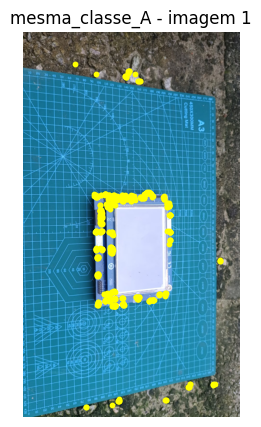

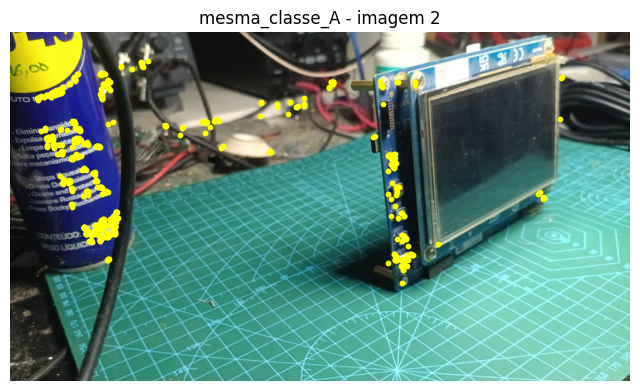

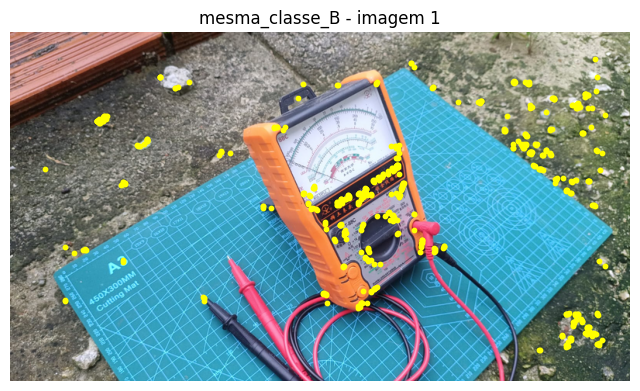

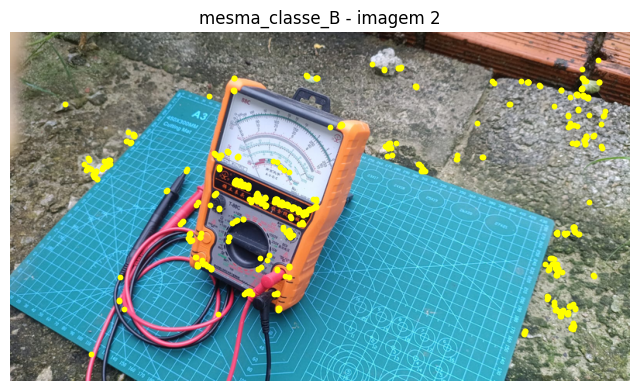

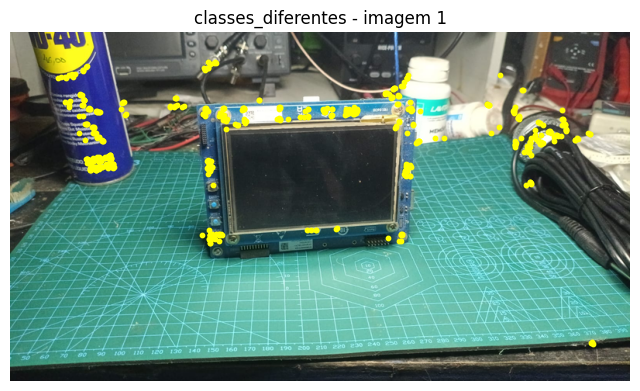

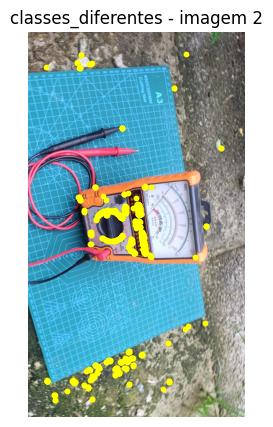

In [11]:
def desenhar_keypoints(item, kp, titulo):
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.imshow(item['rgb'])
    if CV2_DISPONIVEL and kp and hasattr(kp[0], 'pt'):
        xs = [p.pt[0] for p in kp]
        ys = [p.pt[1] for p in kp]
    else:
        xs = [p[0] for p in kp]
        ys = [p[1] for p in kp]
    if xs:
        ax.scatter(xs, ys, s=10, c='yellow')
    ax.set_title(titulo)
    ax.axis('off')
    plt.show()

for nome, res in resultados_locais.items():
    desenhar_keypoints(res['img1'], res['kp1'], nome + ' - imagem 1')
    desenhar_keypoints(res['img2'], res['kp2'], nome + ' - imagem 2')


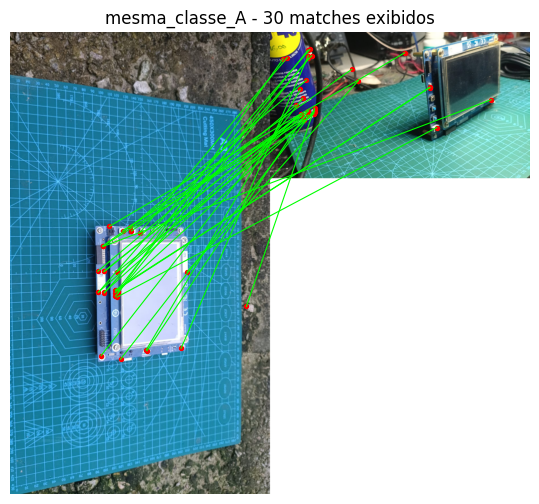

mesma_classe_A | total exibido: 30


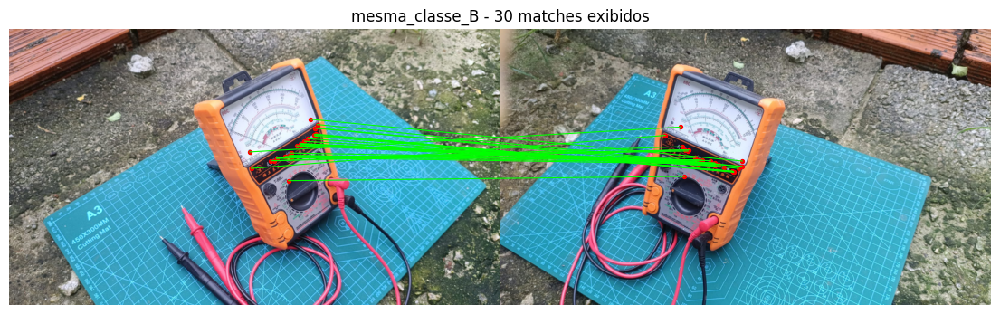

mesma_classe_B | total exibido: 30


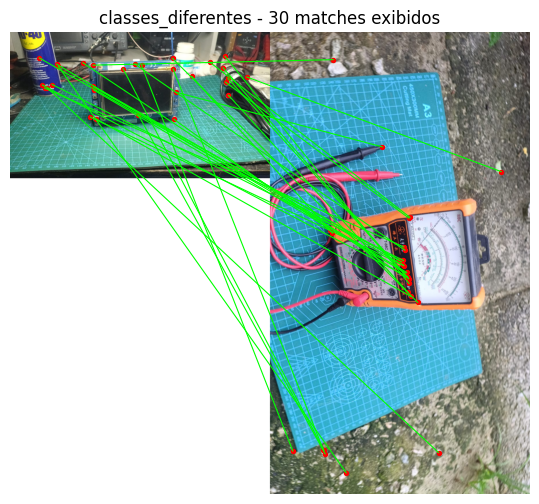

classes_diferentes | total exibido: 30


In [12]:
def obter_xy(kp):
    if CV2_DISPONIVEL and kp and hasattr(kp[0], 'pt'):
        return [(p.pt[0], p.pt[1]) for p in kp]
    return kp


def matching_local(res, max_matches=30):
    des1, des2 = res['des1'], res['des2']
    if des1 is None or des2 is None or len(des1) == 0 or len(des2) == 0:
        return []

    if CV2_DISPONIVEL and res['tipo'] == 'orb':
        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
        matches = bf.match(des1, des2)
        matches = sorted(matches, key=lambda m: m.distance)
        return [(m.queryIdx, m.trainIdx, float(m.distance)) for m in matches[:max_matches]]

    distancias = np.linalg.norm(des1[:, None, :] - des2[None, :, :], axis=2)
    candidatos = []
    for i in range(distancias.shape[0]):
        j = int(np.argmin(distancias[i]))
        if int(np.argmin(distancias[:, j])) == i:
            candidatos.append((i, j, float(distancias[i, j])))
    return sorted(candidatos, key=lambda x: x[2])[:max_matches]


def mostrar_matches(res, titulo, max_matches=30):
    matches = matching_local(res, max_matches=max_matches)
    img1 = res['img1']['rgb']
    img2 = res['img2']['rgb']
    h = max(img1.shape[0], img2.shape[0])
    w = img1.shape[1] + img2.shape[1]
    canvas = np.ones((h, w, 3), dtype=np.uint8) * 255
    canvas[:img1.shape[0], :img1.shape[1]] = img1
    canvas[:img2.shape[0], img1.shape[1]:] = img2

    pontos1 = obter_xy(res['kp1'])
    pontos2 = obter_xy(res['kp2'])

    fig, ax = plt.subplots(figsize=(14, 6))
    ax.imshow(canvas)
    for i, j, d in matches:
        x1, y1 = pontos1[i]
        x2, y2 = pontos2[j]
        x2 += img1.shape[1]
        ax.plot([x1, x2], [y1, y2], color='lime', linewidth=0.8)
        ax.scatter([x1, x2], [y1, y2], c='red', s=8)
    ax.set_title(f'{titulo} - {len(matches)} matches exibidos')
    ax.axis('off')
    plt.show()
    return matches

matches_por_par = {}
for nome, res in resultados_locais.items():
    matches_por_par[nome] = mostrar_matches(res, nome)
    print(nome, '| total exibido:', len(matches_por_par[nome]))


## Interpretação do Matching

Eu espero mais correspondências úteis entre imagens da mesma classe, principalmente quando o ângulo, a iluminação e a escala são parecidos. Mesmo assim, a quantidade de matches não significa qualidade automaticamente: uma imagem pode ter muitos matches fracos ou em regiões pouco relevantes.

Entre classes diferentes, alguns matches ainda podem aparecer porque bordas, cantos e pequenas regiões de contraste existem nos dois objetos. Porém, esses matches tendem a ser menos coerentes semanticamente. Para o meu dataset, iluminação, fundo, escala e ângulo podem atrapalhar bastante, porque mudam a aparência local dos componentes e das bordas.


## Teste de Robustez

Agora eu modifico uma imagem do dataset com rotação leve, redução de contraste e borramento. Depois repito a extração de descritores locais e o matching para observar se o número de keypoints e a qualidade das correspondências mudam.


Keypoints original: 500
Keypoints modificada: 500


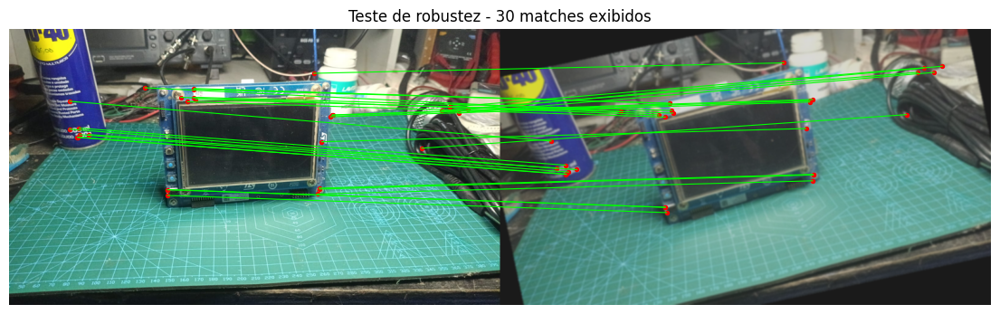

Matches exibidos: 30


In [13]:
def transformar_imagem(item):
    img = Image.fromarray(item['rgb'])
    rotacionada = img.rotate(12, resample=Image.Resampling.BILINEAR, expand=False)
    baixo_contraste = ImageEnhance.Contrast(rotacionada).enhance(0.75)
    borrada = baixo_contraste.filter(ImageFilter.GaussianBlur(radius=1.2))
    rgb = np.array(borrada)
    gray = np.array(borrada.convert('L'))
    return {**item, 'arquivo': item['arquivo'] + ' (modificada)', 'rgb': rgb, 'gray': gray}

imagem_modificada = transformar_imagem(representante_a)
par_robustez = {'img1': representante_a, 'img2': imagem_modificada}
kp1, des1, tipo1 = descritores_locais(representante_a)
kp2, des2, tipo2 = descritores_locais(imagem_modificada)
par_robustez.update({'kp1': kp1, 'kp2': kp2, 'des1': des1, 'des2': des2, 'tipo': tipo1})

print('Keypoints original:', len(kp1))
print('Keypoints modificada:', len(kp2))
robustez_matches = mostrar_matches(par_robustez, 'Teste de robustez')
print('Matches exibidos:', len(robustez_matches))


No teste de robustez, eu observo que rotação, perda de contraste e borramento tendem a alterar a quantidade de pontos detectados. O descritor local preserva parte da estrutura mesmo com pequena transformação, mas perde qualidade quando os detalhes ficam suaves ou menos contrastados.

Assim, eu considero que os descritores locais são parcialmente robustos, mas não imunes às condições de aquisição.


# Parte 4 — Análise de Textura: GLCM e LBP

Nesta etapa eu avalio textura em uma imagem representante de cada classe. Como minhas classes são objetos estruturais e não superfícies altamente texturais, eu uso a imagem inteira redimensionada e interpreto GLCM/LBP como descritores complementares.


In [14]:
def quantizar(gray, niveis=8):
    return np.clip((gray.astype(np.float32) / 256 * niveis).astype(np.uint8), 0, niveis - 1)


def calcular_glcm(gray, distancia=1, deslocamentos=((0, 1), (-1, 1)), niveis=8):
    q = quantizar(gray, niveis=niveis)
    matrizes = []
    for dy, dx in deslocamentos:
        glcm = np.zeros((niveis, niveis), dtype=np.float64)
        y_inicio = max(0, -dy)
        y_fim = q.shape[0] - max(0, dy)
        x_inicio = max(0, -dx)
        x_fim = q.shape[1] - max(0, dx)
        origem = q[y_inicio:y_fim, x_inicio:x_fim]
        destino = q[y_inicio + dy:y_fim + dy, x_inicio + dx:x_fim + dx]
        for i, j in zip(origem.ravel(), destino.ravel()):
            glcm[i, j] += 1
            glcm[j, i] += 1
        glcm /= glcm.sum() + 1e-12
        matrizes.append(glcm)
    return matrizes


def propriedades_glcm(matrizes):
    linhas = []
    for glcm in matrizes:
        i, j = np.indices(glcm.shape)
        contraste = np.sum((i - j) ** 2 * glcm)
        homogeneidade = np.sum(glcm / (1 + np.abs(i - j)))
        energia = np.sqrt(np.sum(glcm ** 2))
        mi = np.sum(i * glcm)
        mj = np.sum(j * glcm)
        si = np.sqrt(np.sum((i - mi) ** 2 * glcm))
        sj = np.sqrt(np.sum((j - mj) ** 2 * glcm))
        correlacao = np.sum((i - mi) * (j - mj) * glcm) / (si * sj + 1e-12)
        linhas.append([contraste, homogeneidade, energia, correlacao])
    return np.mean(linhas, axis=0)

linhas_glcm = []
for item in [representante_a, representante_b]:
    valores = propriedades_glcm(calcular_glcm(item['gray']))
    linhas_glcm.append({
        'Classe': item['classe'],
        'Imagem': item['arquivo'],
        'Contrast': round(float(valores[0]), 4),
        'Homogeneity': round(float(valores[1]), 4),
        'Energy': round(float(valores[2]), 4),
        'Correlation': round(float(valores[3]), 4),
    })

glcm_df = pd.DataFrame(linhas_glcm)
glcm_df


,Classe,Imagem,Contrast,Homogeneity,Energy,Correlation
0,classe_A,STM32N6-DK-frontal.jpeg,0.4277,0.8636,0.3108,0.9355
1,classe_B,Multimetro-Analógico-Classico-frontal_luz_natu...,0.3049,0.8723,0.3768,0.9082


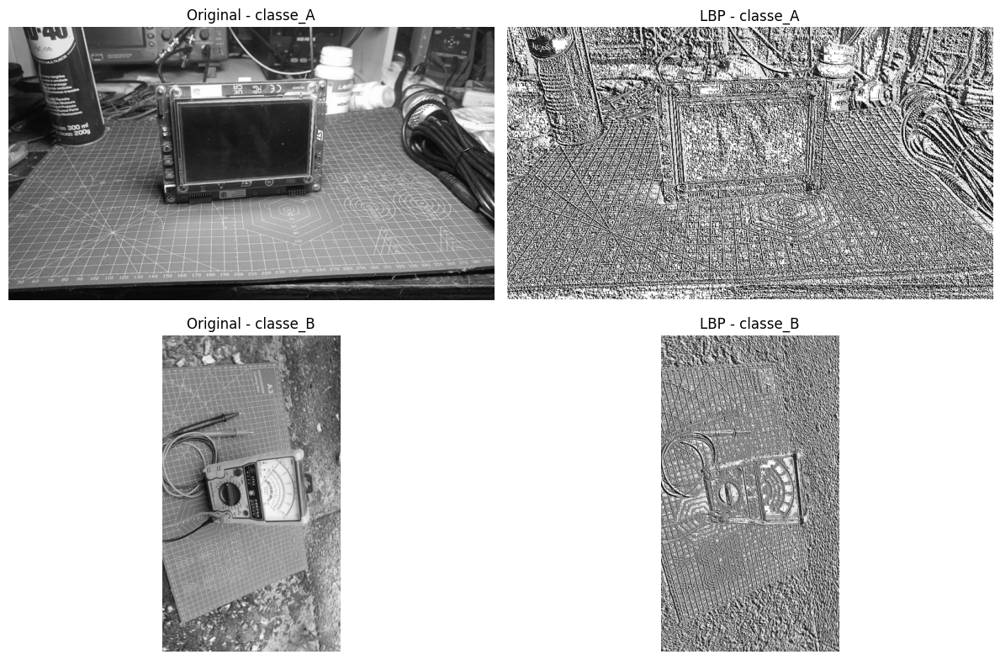

In [15]:
def calcular_lbp(gray):
    img = gray.astype(np.float32)
    centro = img[1:-1, 1:-1]
    vizinhos = [
        img[:-2, :-2], img[:-2, 1:-1], img[:-2, 2:],
        img[1:-1, 2:], img[2:, 2:], img[2:, 1:-1],
        img[2:, :-2], img[1:-1, :-2],
    ]
    lbp = np.zeros_like(centro, dtype=np.uint8)
    for bit, vizinho in enumerate(vizinhos):
        lbp |= ((vizinho >= centro).astype(np.uint8) << bit)
    return lbp

lbp_a = calcular_lbp(representante_a['gray'])
lbp_b = calcular_lbp(representante_b['gray'])

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
for linha, (item, lbp) in enumerate([(representante_a, lbp_a), (representante_b, lbp_b)]):
    axes[linha, 0].imshow(item['gray'], cmap='gray')
    axes[linha, 0].set_title(f"Original - {item['classe']}")
    axes[linha, 0].axis('off')
    axes[linha, 1].imshow(lbp, cmap='gray')
    axes[linha, 1].set_title(f'LBP - {item["classe"]}')
    axes[linha, 1].axis('off')
plt.tight_layout()
plt.show()


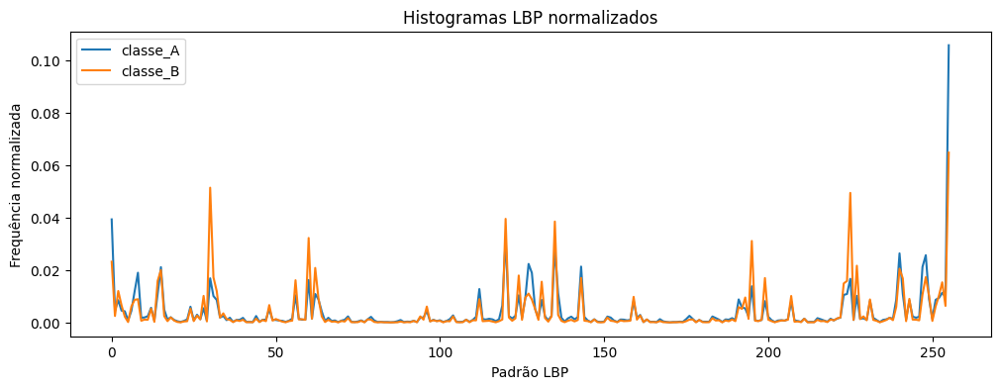

In [16]:
def hist_lbp(lbp):
    hist, _ = np.histogram(lbp.ravel(), bins=256, range=(0, 256), density=True)
    return hist

hist_a = hist_lbp(lbp_a)
hist_b = hist_lbp(lbp_b)

plt.figure(figsize=(12, 4))
plt.plot(hist_a, label='classe_A')
plt.plot(hist_b, label='classe_B')
plt.title('Histogramas LBP normalizados')
plt.xlabel('Padrão LBP')
plt.ylabel('Frequência normalizada')
plt.legend()
plt.show()


## Interpretação GLCM e LBP

A GLCM preserva relações espaciais entre níveis de cinza, como contraste local, homogeneidade, energia e correlação. Ela perde a forma global do objeto, mas ajuda a resumir como as intensidades aparecem próximas umas das outras.

O LBP preserva microestruturas locais, como pequenas transições de intensidade ao redor de cada pixel. Ele perde informações de cor e de forma global, mas pode indicar padrões repetitivos ou regiões com muitos detalhes.

No meu dataset, GLCM e LBP trazem informação complementar, mas eu não considero que sejam os descritores mais fortes. As classes parecem mais separáveis pela estrutura dos objetos do que por textura pura.


# Parte 5 — Síntese Integradora

| Tipo de descritor | O que representa | Vantagens | Limitações | Funcionou bem no meu dataset? |
| --- | --- | --- | --- | --- |
| Histogramas | Distribuição global de intensidade e cor | Simples, rápido e mostra iluminação/cor predominante | Não preserva forma nem posição dos objetos | Parcialmente |
| Estatística global | Média, variância, desvio padrão e entropia | Resume brilho, contraste e diversidade de níveis | Pode confundir classes com iluminação parecida | Parcialmente |
| ORB + matching | Pontos locais, cantos, bordas e correspondências | Preserva estrutura local e ajuda a comparar capturas | Sensível a iluminação, blur, escala e matches falsos | Sim, foi o mais adequado |
| GLCM | Relações espaciais entre intensidades | Resume textura e homogeneidade | Não representa bem forma global | Complementar |
| LBP | Microtexturas locais | Captura pequenas variações e padrões locais | Pode ser fraco quando a diferença principal é estrutural | Complementar |

## Conclusão Final

O descritor mais útil para o meu dataset foi o descritor local com matching, especialmente quando ORB está disponível, porque minhas classes têm diferenças fortes de forma, contorno e estrutura. A placa possui muitos componentes pequenos e o multímetro possui regiões maiores e um mostrador característico. Esse tipo de diferença aparece melhor em pontos de interesse do que em estatísticas globais.

O descritor menos útil foi a estatística global isolada, porque média, variância, desvio padrão e entropia resumem demais a imagem e podem variar bastante por causa da iluminação. GLCM e LBP ajudaram como análise complementar, mas não foram decisivos porque o dataset não é baseado principalmente em textura.

As condições de aquisição influenciaram fortemente os resultados quando houve mudança de luz natural, sombra, ângulo, distância e resolução. Se eu fosse treinar um sistema simples de visão computacional com esse dataset, eu começaria usando descritores locais e medidas globais de apoio, como histogramas e estatísticas, deixando textura como informação complementar.
